# Simplificando el Análisis exploratorio de datos con python IV: Usemos Seaborn para conocer nuestros datos.

## Importar librerías.

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


## Cargar los datos a utilizar.

In [2]:
dir_prin = Path.cwd()
dir_entradas = dir_prin/'entradas'
dir_intermedios = dir_prin/'intermedios'
dir_salidas = dir_prin/'salidas'
df = pd.read_excel(dir_entradas/ 'clima2018_Clean.xlsx')

## Revisión inicial de los datos.

In [3]:
df.head()

,time,precip_intensity,temperature,apparent_temperature,dew_point,humidity,pressure,wind_speed,cloud_cover,dia,mes,hora
0,2018-01-01 00:00:00,0.0,22.44,22.73,18.10,0.77,NaN,0.0,0.19,lun,ene,0
1,2018-01-01 01:00:00,0.0,21.88,22.15,17.75,0.77,NaN,0.0,NaN,lun,ene,1
2,2018-01-01 02:00:00,0.0,21.33,21.63,17.94,0.81,NaN,0.0,NaN,lun,ene,2
3,2018-01-01 03:00:00,0.0,20.77,21.07,17.75,0.83,NaN,0.0,NaN,lun,ene,3
4,2018-01-01 04:00:00,0.0,19.11,19.33,16.79,0.86,NaN,0.0,NaN,lun,ene,4


## Gráficas para distribuciones univariables.

### Histograma

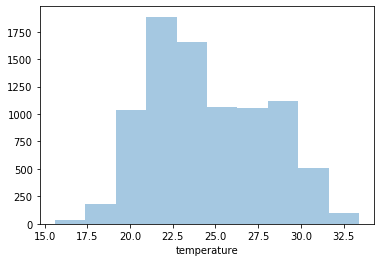

In [35]:
sns.distplot(df['temperature'], bins=10, kde=False, rug=False);

### Kernel density estimation (KDE).

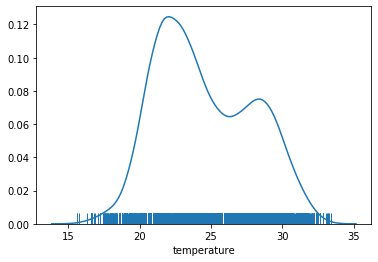

In [5]:
sns.distplot(df['temperature'], hist=False, rug=True);

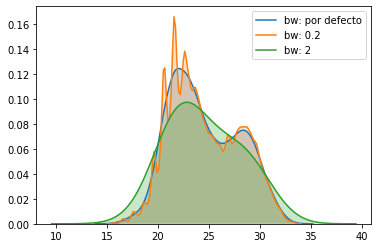

In [6]:
sns.kdeplot(df['temperature'], label="bw: por defecto", shade=True)
sns.kdeplot(df['temperature'], bw=.2, label="bw: 0.2", shade=True)
sns.kdeplot(df['temperature'], bw=2, label="bw: 2", shade=True)
plt.legend();

### KDE e histograma juntos.

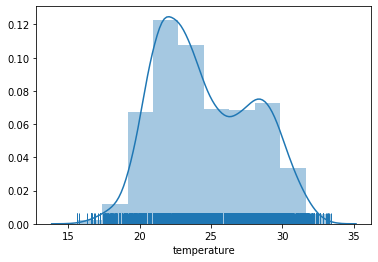

In [7]:
sns.distplot(df['temperature'], bins=10, rug=True);

### Curva de probabilidad acumulada.

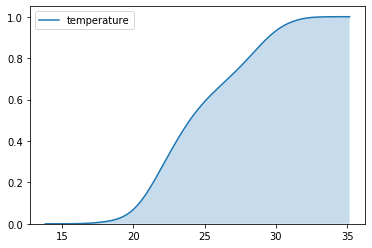

In [8]:
sns.kdeplot(df['temperature'], cumulative =True, shade=True);

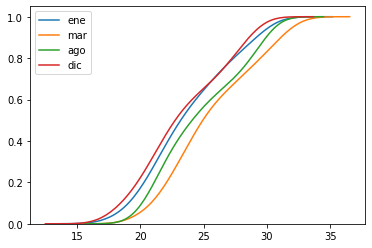

In [9]:
for x in df.query("mes in ['ene', 'mar', 'ago', 'dic']")['mes'].unique().tolist():
    sns.kdeplot(df[df['mes'] == x]['temperature'], cumulative =True, label = x)
plt.legend;

### Curva de probabilidad acumulada e histograma juntos.

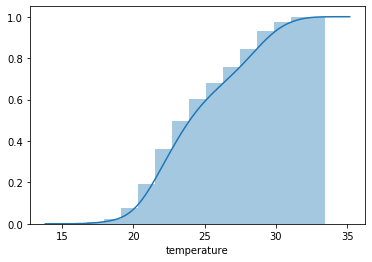

In [10]:
sns.distplot(df['temperature'], bins = 15, kde_kws={"cumulative": True}, hist_kws={"cumulative": True});

## Gráficas de dispersión con variables categóricas

### Efecto jitter

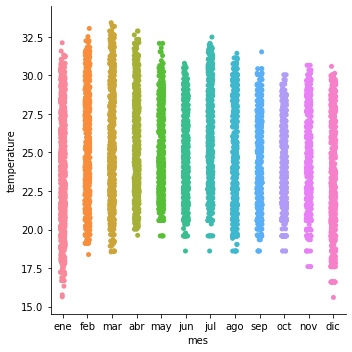

In [11]:
sns.catplot(x="mes", y="temperature", jitter=True, data=df);

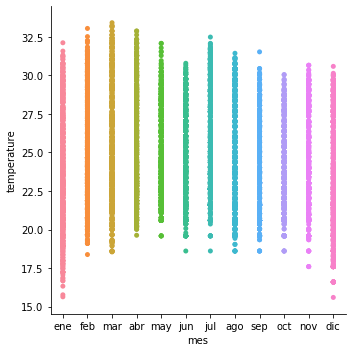

In [12]:
sns.catplot(x="mes", y="temperature", jitter=False, data=df);

### Gráficas tipo strip

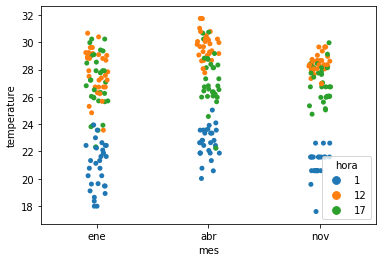

In [36]:
sns.stripplot(x="mes", y="temperature", hue= "hora", data=df.query("mes in ['ene', 'abr', 'nov'] & hora in [1, 12, 17]"));

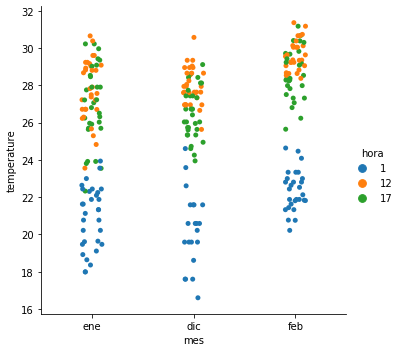

In [14]:
sns.catplot(x="mes", y="temperature", hue= "hora", order = ["ene", "dic", "feb"], kind="strip", data=df.query("mes in ['ene', 'feb', 'dic'] & hora in [1, 12, 17]") );

### Gráficas tipo swarm

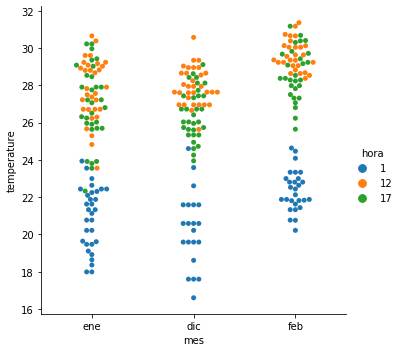

In [15]:
sns.catplot(x="mes", y="temperature", hue= "hora", order = ["ene", "dic", "feb"], kind="swarm", data=df.query("mes in ['ene', 'feb', 'dic'] & hora in [1, 12, 17]") );

### Diagrama de cajas

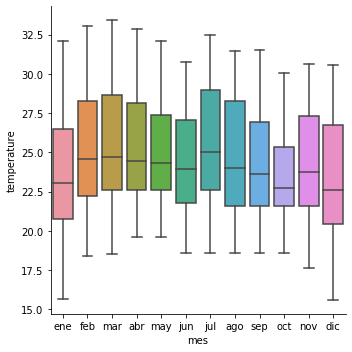

In [16]:
sns.catplot(x="mes", y="temperature", kind="box", data=df);

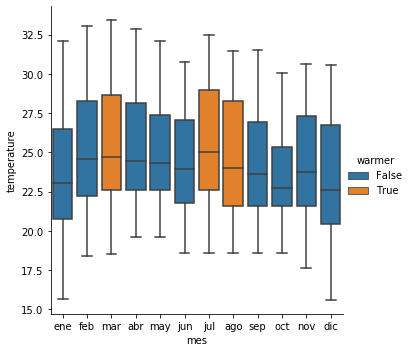

In [17]:
df["warmer"] = df["mes"].isin(["mar", "jul", "ago"])
sns.catplot(x="mes", y="temperature", hue="warmer",
            kind="box", dodge=False, data=df);

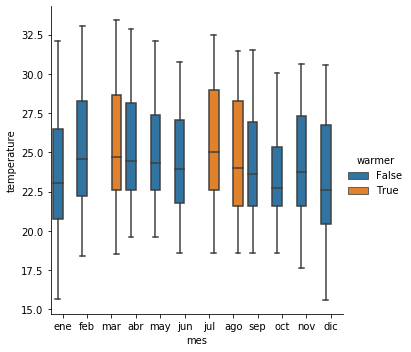

In [18]:
sns.catplot(x="mes", y="temperature", hue="warmer",
            kind="box", data=df);

### Diagramas tipo boxen

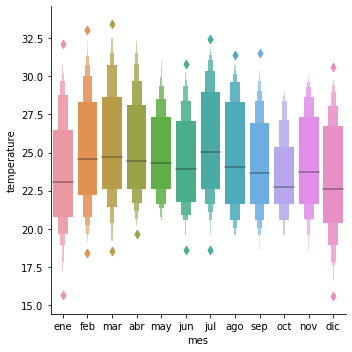

In [19]:
sns.catplot(x="mes", y="temperature", kind="boxen", data=df);

### Diagramas de violín

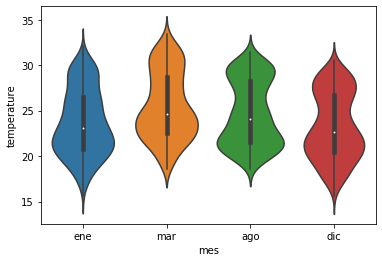

In [20]:
sns.violinplot(x="mes", y="temperature", data=df.query("mes in ['ene', 'mar', 'ago', 'dic']"));

### Diagramas de violín agrupados

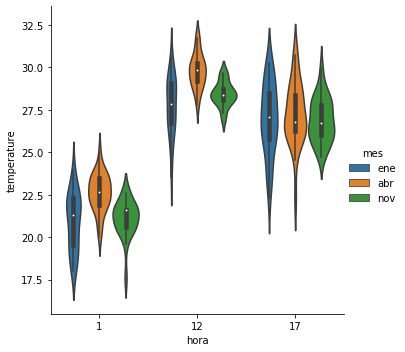

In [21]:
sns.catplot(x="hora", y="temperature", hue="mes", kind="violin", data=df.query("mes in ['ene', 'abr', 'nov'] & hora in [1, 12, 17]"));

### Diagramas de violín partidos

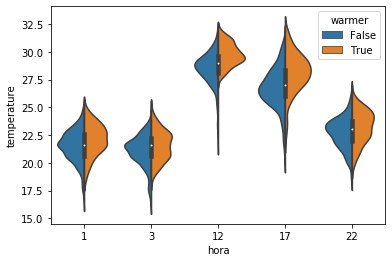

In [22]:
sns.violinplot(x="hora", y="temperature", hue = "warmer", split=True, data=df.query("hora in [1, 3, 12, 17, 22]"));

### Multi-plot grids

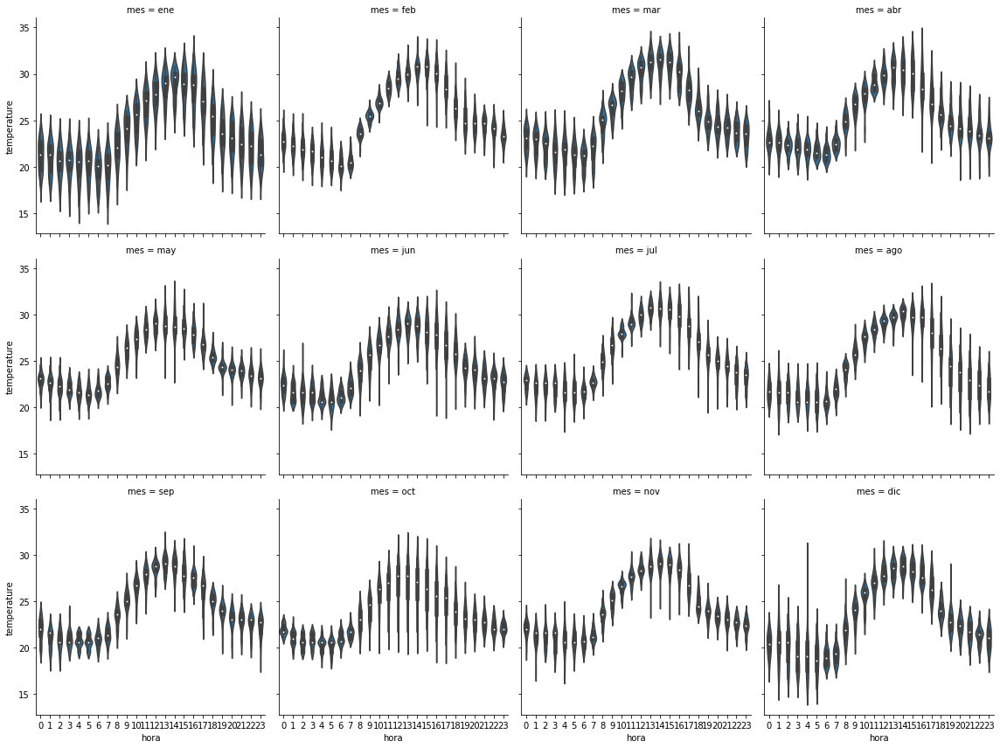

In [23]:
g = sns.FacetGrid(df, col="mes", col_wrap=4, height=4)
g = g.map(sns.violinplot, "hora", "temperature")

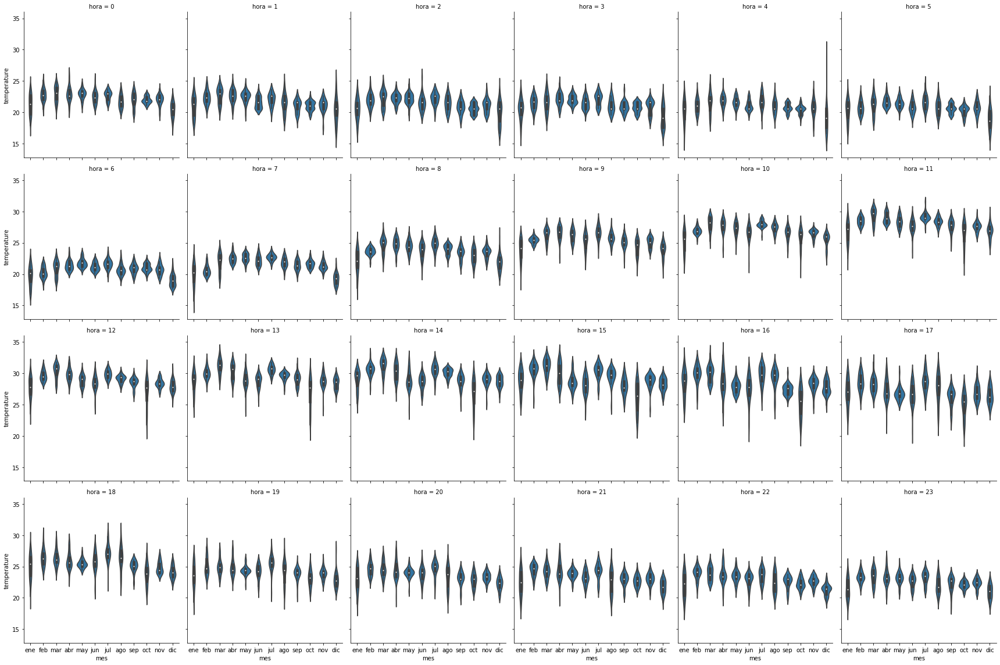

In [24]:
g = sns.FacetGrid(df, col="hora", col_wrap=6, height=4)
g = g.map(sns.violinplot, "mes", "temperature")

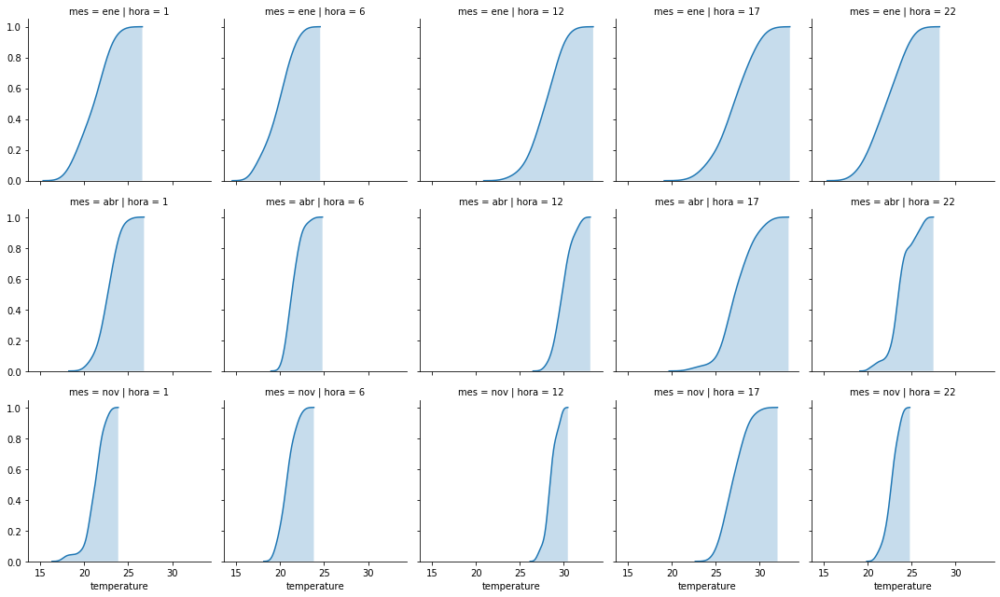

In [25]:
g = sns.FacetGrid(df.query("mes in ['ene', 'abr', 'nov'] & hora in [1, 6, 12, 17, 22]"), col="hora", row="mes", height=3)
g = g.map(sns.kdeplot, "temperature", cumulative=True, shade=True)

## NO OLVIDES SUSCRIBIRTE A SIMPLIFICANDO DATOS